In [1]:
# connect drive to colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# import modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plot
import random
from scipy import stats
from random import seed
from random import randint
import plotly.express as px


# 1. Introduction

This report is centred around the analysis of health and fitness data obtained from the Physical Activity Monitoring (PAMAP2) dataset. There is an accompanying readme file for the dataset, **readme.pdf** which serves as a guide to the dataset.

The dataset contains data from 9 participants using activity monitors in adherence to a protocol spanning 12 different physical activities. The data was sampled at varying timescales and covered a range of variables including temperature, heart rate, motion and orietation data.

There is also additional 'Optional' data on 6 other activities. 
There is also data on the characteristics of the study participants such as age, gender, height and weight. This information is contained in the **subject information.pdf** file.






## 1.1 The study participants

Here, we have basic information related to the age, gender, height,weight and BMI of all the participants. The data was obtained from the subject information pdf, converted into a csv file and subsequently imported for analysis. 

Nine participants took part in the study - (8 male, 1 female). The mean age was 26.7 years (SD 3.12) , and the average body mass 82kg. Also, the female particpant was significantly shorter and weighed less than the other participants. The male subjects were significantly taller and heavier (save one male participant) than the female subject.

<br>

According to the readme file, the average BMI of the participants was 25.11 +/- 2.62 kgm-3.



In [3]:
biodata = pd.read_csv('/content/drive/MyDrive/Sussex/DSRM/Report 2/subjectinfo.csv')

In [4]:
biodata.describe()

,Subject ID,Age (years),Height (cm),Weight (kg),Resting HR,Max HR
count,8.00000,8.00000,8.000000,8.000000,8.000000,8.00000
mean,104.50000,26.75000,180.875000,82.875000,66.375000,193.25000
std,2.44949,3.19598,7.772433,9.030702,6.545173,3.19598
min,101.00000,23.00000,169.000000,69.000000,58.000000,188.00000
25%,102.75000,24.75000,177.500000,76.750000,60.000000,192.00000
50%,104.50000,26.00000,181.000000,84.500000,67.000000,194.00000
75%,106.25000,28.00000,184.000000,88.250000,71.000000,195.25000
max,108.00000,32.00000,194.000000,95.000000,75.000000,197.00000


## 1.2 The physical activity data

The activity data is the main portion of the collected data and is analyzed more extensively in a later section.

## 1.3 Optional Data

The optional data collected on the other activities was not included in the study.

# 2. Physical Activity Data

## 2.1 Data Structure

The data was read in from the source DAT files and imported as dataframe objects using pandas. Each resulting object is a pandas dataframe.
<br><br>
The data for each participants resides in individual dataframes, but larger dataframes are eventually constructed to bring in all the data and make central data pools.
<br><br>
The headings are renamed with meaningful headers for better readability and to help with labelling the plots which follow.


## N.B
Data used in this notebook can be found and downloaded from:
<br></br>
https://archive.ics.uci.edu/ml/datasets/pamap2+physical+activity+monitoring

In [5]:
title1 = range(0,54)
df1 = pd.read_table('/content/drive/MyDrive/Sussex/DSRM/Report 2/PAMAP2_Dataset/Protocol/subject101.dat', sep= ' ', names= title1)
df2 = pd.read_table('/content/drive/MyDrive/Sussex/DSRM/Report 2/PAMAP2_Dataset/Protocol/subject102.dat', sep= ' ', names= title1)
df3 = pd.read_table('/content/drive/MyDrive/Sussex/DSRM/Report 2/PAMAP2_Dataset/Protocol/subject103.dat', sep= ' ', names= title1)
df4 = pd.read_table('/content/drive/MyDrive/Sussex/DSRM/Report 2/PAMAP2_Dataset/Protocol/subject104.dat', sep= ' ', names= title1)
df5 = pd.read_table('/content/drive/MyDrive/Sussex/DSRM/Report 2/PAMAP2_Dataset/Protocol/subject105.dat', sep= ' ', names= title1)
df6 = pd.read_table('/content/drive/MyDrive/Sussex/DSRM/Report 2/PAMAP2_Dataset/Protocol/subject106.dat', sep= ' ', names= title1)
df7 = pd.read_table('/content/drive/MyDrive/Sussex/DSRM/Report 2/PAMAP2_Dataset/Protocol/subject107.dat', sep= ' ', names= title1)
df8 = pd.read_table('/content/drive/MyDrive/Sussex/DSRM/Report 2/PAMAP2_Dataset/Protocol/subject108.dat', sep= ' ', names= title1)
df9 = pd.read_table('/content/drive/MyDrive/Sussex/DSRM/Report 2/PAMAP2_Dataset/Protocol/subject109.dat', sep= ' ', names= title1)

In [6]:
# Function for renaming column headers using readme info
def renamedatacolumns(df):
    df.rename(columns={0: 'timestamp', 1: 'activityId', 2: 'heart_rate', 3: 'hand_temp', 4: 'hand_accl_1', 5: 'hand_accl_2', 6: 'hand_accl_3', 7 : 'hand_accl_1_void', 8 : 'hand_accl_2_void', 
                    9 : 'hand_accl_3_void', 10 : 'hand_gyro_1', 11 : 'hand_gyro_2', 12 : 'hand_gyro_3', 13 : 'hand_mag_1', 14 : 'hand_mag_2', 15 : 'hand_mag_3', 16 : 'hand_orient_1', 
                    17 : 'hand_orient_2', 18 : 'hand_orient_3', 19 : 'hand_orient_4', 20 : 'chest_temp', 21 : 'chest_accl_1', 22 : 'chest_accl_2', 23 : 'chest_accl_3', 24 : 'chest_accl_1_void',
                    25 : 'chest_accl_2_void', 26 : 'chest_accl_3_void', 27 : 'chest_gyro_1', 28 : 'chest_gyro_2', 29 : 'chest_gyro_3', 30 : 'chest_mag_1', 31 : 'chest_mag_2', 32 : 'chest_mag_3',
                    33 : 'chest_orient_1', 34 : 'chest_orient_2', 35 : 'chest_orient_3', 36 : 'chest_orient_4', 37 : 'ankle_temp', 38 : 'ankle_accl_1', 39 : 'ankle_accl_2', 40 : 'ankle_accl_3', 
                    41 : 'ankle_accl_1_void', 42 : 'ankle_accl_2_void', 43 : 'ankle_accl_3_void', 44 : 'ankle_gyro_1', 45 : 'ankle_gyro_2', 46 : 'ankle_gyro_3', 47 : 'ankle_mag_1', 48 : 'ankle_mag_2', 
                    49 : 'ankle_mag_3', 50 : 'ankle_orient_1', 51 : 'ankle_orient_2', 52 : 'ankle_orient_3',   53 : 'ankle_orient_4', 
                   }, inplace=True)
    return df

    

In [7]:
# rename each dataframe column header using function
dfslist = (df1, df2, df3, df4, df5, df6, df7, df8, df9)
for df in dfslist:
  renamedatacolumns(df)

## 2.2 Data pre-processing
The raw data from the PAMAP 2 dataset, because it is realistic, has imperfections. There are four main issues:
<br>
a) cells with missing data due to equipment malfunction and 
<br>
b) mismatched sample rates from the instruments and
<br>
c) the data which has been collected at a very high sample rate would easily benefit from downsampling to more maneageable temporal resolution.
<br>
d) data which has been marked usuitable for other reasons






### 2.2.1 Removal of data associated with ActivityID "0"
Going by the guidance in the readme document issued with the dataset, we will remove all the rows in which the value of the ActivityID column is equal to zero.

In [8]:
df1=df1[df1['activityId'] !=0]
df2=df2[df2['activityId'] !=0]
df3=df3[df3['activityId'] !=0]
df4=df4[df4['activityId'] !=0]
df5=df5[df5['activityId'] !=0]
df6=df6[df6['activityId'] !=0]
df7=df7[df7['activityId'] !=0]
df8=df8[df8['activityId'] !=0]
df9=df9[df9['activityId'] !=0]

### 2.2.2 Removal of empty rows from HRM/ Downsampling

Here, we remove all the rows of data where the heart rate monitor data is missing. The data from the heart rate sensor was sampled at a rate of 9 Hertz (Hz)- meaning sampling was done 9 times every second.
<br><br>
Given that the IMU units sample data at a higher frequency of 100Hz, there is a mismatch. By bringing the readings from all instruments to a common temporal baseline we get rid of some NA values while also effectively downsampling the data.

In [9]:
df1=df1[df1['heart_rate'].notna()]
df2=df2[df2['heart_rate'].notna()]
df3=df3[df3['heart_rate'].notna()]
df4=df4[df4['heart_rate'].notna()]
df5=df5[df5['heart_rate'].notna()]
df6=df6[df6['heart_rate'].notna()]
df7=df7[df7['heart_rate'].notna()]
df8=df8[df8['heart_rate'].notna()]
df9=df9[df9['heart_rate'].notna()]

### 2.2.3 Removal of data from Accelerometer 2
We drop the values in columns 7, 8, 9, 24, 25, 26, 41, 42 and 43 due to instrument unreliability and miscalibration. This is in line with the instructions given in the companion readme file concerning data from the second accelerometer.



In [10]:
dfslist = (df1, df2, df3, df4, df5, df6, df7, df8, df9)
for df in dfslist:
  df.drop(columns = ['hand_accl_1_void','hand_accl_2_void','hand_accl_3_void', 'chest_accl_1_void', 'chest_accl_2_void', 'chest_accl_3_void','ankle_accl_1_void', 'ankle_accl_2_void', 'ankle_accl_3_void'], inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


### 2.2.4 Removal of orientation data.
The data from the following columns are also dropped in this step:  
<br>
'hand_orient_1' through 'hand_orient_4' <br>
'chest_orient_1' through 'chest_orient_4' <br>
'ankle_orient_1' through 'ankle_orient_4' <br>

<br>

This is again because the instructions given in 
the companion readme file states that the orientation data is invalid for the three IMU units, necessitating the deletion of 12 more data columns in each dataframe.


In [11]:
dfslist = (df1, df2, df3, df4, df5, df6, df7, df8, df9)
for df in dfslist:
  df.drop(columns = ['hand_orient_1','hand_orient_2','hand_orient_3', 'hand_orient_4','chest_orient_1', 'chest_orient_2', 'chest_orient_3','chest_orient_4',
                     'ankle_orient_1', 'ankle_orient_2', 'ankle_orient_3', 'ankle_orient_4'], inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,



### 2.2.5 Removal of NA values
After downsampling, some data is still misssing, due to signal dropouts for some of the instruments. Because our data has such high temporal resolution, we can and go on to delete all records with missing values.

In [12]:
# remove all rows of data in df, for rows with na, using column with highest count of null values as index
df1 = df1[df1['hand_temp'].notna()]

# some NA values remain in certain columns, move on to removing all rows containing those values in said columns
df1 = df1[df1['chest_temp'].notna()]
df1 = df1[df1['ankle_temp'].notna()]
# use a more general argument in drop na to remove all rows with missing values from all dataframes
# drop all rows with missing values set as na
df2 = df2.dropna(how='any',axis=0) 
df3 = df3.dropna(how='any',axis=0)
df4 = df4.dropna(how='any',axis=0) 
df5 = df5.dropna(how='any',axis=0)
df6 = df6.dropna(how='any',axis=0) 
df7 = df7.dropna(how='any',axis=0)
df8 = df8.dropna(how='any',axis=0) 
df9 = df9.dropna(how='any',axis=0)    
# all missing values have now been removed



In [13]:
# Add participantID to each participant's data for labelling and trackback
df1.insert(1, "ParticipantId", "1")
df2.insert(1, "ParticipantId", "2")
df3.insert(1, "ParticipantId", "3")
df4.insert(1, "ParticipantId", "4")
df5.insert(1, "ParticipantId", "5")
df6.insert(1, "ParticipantId", "6")
df7.insert(1, "ParticipantId", "7")
df8.insert(1, "ParticipantId", "8")
df9.insert(1, "ParticipantId", "9")

### 2.2.6 Computation of linear acceleration

The data from the 3 axis accelerometers was converted into linear acceleration. By reintegrating the 3 components, we derive a variable is more meaningful and that can be investigated more easily.

In [14]:
def linaccelankle(df):
  df['xankle'] = df.loc[:, ('ankle_accl_1')]**2
  df['yankle'] = df.loc[:, ('ankle_accl_2')]**2
  df['zankle'] = df.loc[:, ('ankle_accl_3')]**2
  df['ankle_linear'] = np.sqrt(df[['xankle', 'yankle','zankle']].sum(axis=1))

  return df

def linaccelhand(df):
  df['xhand'] = df.loc[:, ('hand_accl_1')]**2
  df['yhand'] = df.loc[:, ('hand_accl_2')]**2
  df['zhand'] = df.loc[:, ('hand_accl_3')]**2
  df['hand_linear'] = np.sqrt(df[['xhand', 'yhand','zhand']].sum(axis=1))
  return df

def linaccelchest(df):
  df['xchest'] = df.loc[:, ('chest_accl_1')]**2
  df['ychest'] = df.loc[:, ('chest_accl_2')]**2
  df['zchest'] = df.loc[:, ('chest_accl_3')]**2
  df['chest_linear'] = np.sqrt(df[['xchest', 'ychest','zchest']].sum(axis=1))
  return df

In [15]:
# apply linear acceleration functions to the dfs 
dfslist = (df1, df2, df3, df4, df5, df6, df7, df8, df9)
for df in dfslist:
  linaccelankle(df)
  linaccelhand(df)
  linaccelchest(df)

# Drop intermediate columns used above. Manual because Pandas df.drop refuses to reassign 'dropped column' df to same variable, nor allow direct reassignment (SettingWithCopyWarning)
# Creating iloc based function does not work either, returns (SettingWithCopyWarning). Impossible to make new df with append in later step.

df1in = df1.loc[:, ('timestamp', 'ParticipantId','activityId', 'heart_rate',
                    'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3', 
                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                    'ankle_linear', 'hand_linear', 'chest_linear')]  

df2in = df2.loc[:, ('timestamp', 'ParticipantId','activityId', 'heart_rate',
                    'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3', 
                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                    'ankle_linear', 'hand_linear', 'chest_linear')] 
df3in = df3.loc[:, ('timestamp', 'ParticipantId','activityId', 'heart_rate',
                    'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3', 
                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                    'ankle_linear', 'hand_linear', 'chest_linear')]
df4in = df4.loc[:, ('timestamp', 'ParticipantId','activityId', 'heart_rate',
                    'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3', 
                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                    'ankle_linear', 'hand_linear', 'chest_linear')]
df5in = df5.loc[:, ('timestamp', 'ParticipantId','activityId', 'heart_rate',
                    'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3', 
                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                    'ankle_linear', 'hand_linear', 'chest_linear')]
df6in = df6.loc[:, ('timestamp', 'ParticipantId','activityId', 'heart_rate',
                    'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3', 
                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                    'ankle_linear', 'hand_linear', 'chest_linear')]
df7in = df7.loc[:, ('timestamp', 'ParticipantId','activityId', 'heart_rate',
                    'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3', 
                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                    'ankle_linear', 'hand_linear', 'chest_linear')]
df8in = df8.loc[:, ('timestamp', 'ParticipantId','activityId', 'heart_rate',
                    'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3', 
                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                    'ankle_linear', 'hand_linear', 'chest_linear')]
df9in = df9.loc[:, ('timestamp', 'ParticipantId','activityId', 'heart_rate',
                    'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3', 
                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                    'ankle_linear', 'hand_linear', 'chest_linear')]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

### 2.2.7 Split into training and testing datasets
At this point, we combine the data from our participants into two dataframes - one for analysis and training purposes and the other for testing.
<br><br>
Considering that there are nine participants, we will compile the data from six of them into our training set, witholding the data from three participants, selected at random, as testing data in a later section. This split ratio reflects the 70% training/30% testing ratio considered best practice.
<br>
We use a random number function to determine which participant datasets to merge into the training and test datasets.



In [16]:
# generate random integer values
# seed random number generator
seed(1993)
# generate some integers
for n in range(3):
	value = randint(0, 9)
	print("This participant will be selected for inclusion in the test set: " + str(value))
  # print(str(value))

This participant will be selected for inclusion in the test set: 7
This participant will be selected for inclusion in the test set: 9
This participant will be selected for inclusion in the test set: 4


In [17]:
# construct test dataset by combining the data from 3 randomly selected participants into one data pool
# training dataset constucted by combining remainder of data
training = df1in.append([df2in, df3in, df5in, df6in, df8in])
test = df4in.append([df7in, df9in])


### 2.2.8 Categorisation of activities

According to the Physical Activity Guidelines Advisory Committee Report (PAGAC 2008), the activities covered in this dataset can be grouped into the following categories based on the absolute intensity of the activities. This is done using the metabolic equivalent (MET) - a measure which quantifies the rate at which energy is expended while these activites are carried out, relative to the energy consumption of a body at rest (1 MET).
<br><br>
**Light Intensity**<br>
The activities in this category are: lie (1), sit (2), stand (3) and iron (17). Activities in this category have MET scores ranging from 1.1 to 2.9 MET.

**Moderate Intensity**<br>
The activities in this group include normal walk (4) cycle (6) and  vacuuum (16). This category has a range of 3.0 to 5.9 MET.

**Vigorous Intensity**<br>
The activites under this classification include run (5) and rope jump (24). They have MET scores ranging from 6.0 or higher.

The MET scores for these activities have been taken from the companion documentation and grouped according to the Advisory Committee report's guidelines.


<br>

There are some contradictions regarding activity labelling between some of the documents attached to the dataset.
The **readme.pdf** file has been taken as the gold standard and as a key for interpreting the raw data as it is the main guidance literature.

<br>

**Document 2** - DescriptionofActivities.pdf and **Document 3** - DataCollectionProtocol.pdf have been consulted for specifics only contained in these files. **Document 4** - PerformedActivitiesSummary.pdf was also consulted as necessary.
<br>



### 2.2.9 Training and testing dataset update
After the initial histogram showed data missing under certain activities, the activities devoid of data are removed. These are activities: 8, 9, 10, 11, 14, 15, 18, 19, 20, 21, 22 and 23. 
<br><br>
Also, the activities are grouped by their intensity category.

In [18]:
# creating clean dataframes
training_clean = training.loc[training['activityId'].isin([1, 2, 3, 4, 5, 6, 16, 17, 24])]
test_clean = test.loc[test['activityId'].isin([1, 2, 3, 4, 5, 6, 16, 17, 24])]

In [19]:
# grouping activities by intensity using new activity intensity column
# create a list of our conditions
conditions = [
    (training_clean['activityId'] == 1),(training_clean['activityId'] == 2),(training_clean['activityId'] == 3),(training_clean['activityId'] == 17),
    (training_clean['activityId'] == 4),(training_clean['activityId'] == 6),(training_clean['activityId'] == 16),(training_clean['activityId'] == 5),(training_clean['activityId'] == 24)]

values = ['Light Intensity', 'Light Intensity', 'Light Intensity', 'Light Intensity','Moderate Intensity', 'Moderate Intensity','Moderate Intensity','Vigorous Intensity', 'Vigorous Intensity']

# # for the training dataset
training_clean['activity_intensity'] = np.select(conditions, values)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


# 3. Data Exploration

## 3.1
In this section, we delve into our data, visualizing it to identify probable relationships between variables of interest. We will conduct summary statistics and use various graphs and charts to present our data in a form more easily understood and digested.


## 3.2 Variables of interest
By exploring the data, we examine intuitions concerning ostensibly related variables in our clean, pre-processed dataset.
<br>
Visualizing the data helped determine just how factual the intuition that Heart rate and temperature readings (chest, ankle and hand) are important variables in the dataset 
<br>
Accelerometers and gyroscopes are instruments for measuring acceleration and movement in a 3D space. Considering that movement is related to physical activity, acclerometer data is a variable of interest. Considering that movement is primarily facilitated my leg motion in humans, readings from the ankle IMU unit were investigated closely.
<br><br>

Changes in body temperature have been linked to increased physical exertion in the literature and so, temperature has been selected as a variable of interest across all three instrumentation sites - hand, chest and ankle (Taylor et al., 2008).

<br>

Because of a lack of domain knowledge on magnetometers and gyroscopes, the readings from these instruments will be largely ignored in this study.


## 3.3 Boxplots, Histograms and Descriptive Statistics

### 3.3.1 Boxplots

In [45]:
# required imports
import plotly.express as px
import plotly.graph_objects as go


In [46]:
df = training_clean
fig = px.box(df, x="activityId", y="heart_rate", color="activity_intensity"
                )
fig.update_layout(
    title={
        'text': "Figure 1: Boxplot of heart rate across activities in Training Data",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        xaxis_title="Activity ID",
        yaxis_title="Heart Rate (bpm)",
        
        )
fig.show()

On visualizing the Training dataset, the boxplot in Figures 1 and 2 clearly shows that many of the activities (6 - 15 and 18 - 23) do not contain any data. This streamlines the number of activities to be considered. However, all of the aforementioned activity intensity groupings are still well-represented. 

<br>




In Figure 1, the activities in the Vigorous intensity category, run(5) and rope jump (24) are visibly associated with higher heart rates compared to activities in the other categories with rope jumping reaching 202 bpm. 

<br>

The activities in the moderate category, normal walk (4) cycle (6) and  vacuuum (16) have an average of about 120 bpm.

<br>

In the low intensity category, the heart rate measured during activities never exceeded 107bpm and contained readings as low as 60 bpm. 


In [21]:
import plotly.express as px
import plotly.graph_objects as go

df = training_clean
fig = px.box(df, x="activityId", y="hand_temp", color="activity_intensity"
                )
fig.update_layout(
    title={
        'text': "Figure 2: Boxplot of hand temperature across activities in Training Data",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        xaxis_title="Activity ID",
        yaxis_title="Chest Temperature (degrees C) ",
        
        )
fig.show()

In Figure 2 above, hand temperature appears to be highest in the Light intensity category and lowest in the Vigorous intensity category. The median temperature in the sit (1) activity is 33.5 degrees C, as opposed to the median of 30.8 degrees C in the run (4) activity.

<br>

The lower temperatures associated with vigorous intensity activities may be linked to the fact pespiration is more likely to occur under those circumstances. Pespiration helps to regulate body temperature. This information is mirrored in the high negative correlation between the two variables as discussed in a later section.

<br>

The data for the chest temperature variable follows a similar pattern, but the chest temperatures are generally higher by about 3 degrees C.

In [22]:
import plotly.express as px
import plotly.graph_objects as go

df = training_clean
fig = px.box(df, x="activityId", y="ankle_linear", color="activity_intensity"
                )
fig.update_layout(
    title={
        'text': "Figure 3: Boxplot of ankle linear accceleration across activities in Training Data",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        xaxis_title="Activity ID",
        yaxis_title="Ankle linear acceleration",
        
        )
fig.show()

### 3.3.2 Histograms

In [23]:
import plotly.express as px
df = training_clean
fig = px.histogram(df, x="heart_rate", color="activity_intensity")
fig.update_layout(
    title={
        'text': "Figure 4: Histogram of heart rate across activities in Training Data",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        xaxis_title="Heart Rate (bpm)",
        yaxis_title="Count",
        )

The distribution of heart rate data across activity categories as seen in Figure 4, gives some insight into the distribution of the data.
<br>
The data in the Light intensity category appears to have a somewhat normal distribution, while the data in the Moderate category appears to have a bimodal distribution. The data distribution in the vigorous category appears to be a plateau.

<br>

To improve the clarity of the plots, the data will be sectioned out by indensity category and re-presented.

In [24]:
import plotly.express as px

# Light intensity acivity Heart rate histogram

light_hr = training_clean.groupby('activity_intensity')['heart_rate']
df = training_clean
fig = px.histogram(df, x="heart_rate")
fig.update_layout(
    title={
        'text': "Figure 4: Histogram of heart rate across activities in Training Data",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        xaxis_title="Heart Rate (bpm)",
        yaxis_title="Count",
        
        )

In [25]:
import plotly.express as px
df = training_clean
fig = px.histogram(df, x="ankle_linear", color="activity_intensity")
fig.show()

### 3.3.4 Summary statistics

Summmary plots - Tables

1. group by activity, compute Mean and std of VOI
<br>
2. group by activity category, compute mean and std of VOI
<br>
3. group by participants, compute mean and std of VOI

In [26]:
heartratestats = training_clean.groupby('activityId')['heart_rate'].describe()
heartratestats.style

,count,mean,std,min,25%,50%,75%,max
activityId,,,,,,,,
1,13130.000000,77.319117,9.440397,60.000000,71.000000,75.000000,82.000000,107.000000
2,13435.000000,80.151470,7.405043,66.000000,75.000000,79.000000,85.000000,109.000000
3,12661.000000,88.977569,8.183788,73.000000,82.000000,89.000000,93.000000,112.000000
4,15314.000000,115.406425,9.115985,92.000000,112.000000,119.000000,122.000000,128.000000
5,8347.000000,158.317479,21.023462,105.000000,149.000000,166.000000,173.000000,196.000000
6,10800.000000,124.910185,8.647563,81.000000,119.000000,125.000000,131.000000,144.000000
16,12202.000000,104.603344,14.246205,77.000000,95.000000,101.000000,110.000000,140.000000
17,16737.000000,89.502719,5.526532,78.000000,85.000000,89.000000,92.000000,107.000000
24,3773.000000,163.838060,22.486098,121.000000,143.000000,173.000000,181.000000,202.000000


In the table above, heart rate descriptive statistics are presented for various activities. WE can see the large variation around the mean present in the vigorous class activities, as well as the higher mean values.

<br>

The table below on the other hand shows the statistics for ankle temperature and how it varies across activities.

In [27]:
ankletempstats = training_clean.groupby('activityId')['ankle_temp'].describe()
ankletempstats.style

,count,mean,std,min,25%,50%,75%,max
activityId,,,,,,,,
1,13130.000000,33.324829,1.250189,30.750000,32.000000,33.750000,34.437500,34.687500
2,13435.000000,33.788161,0.834343,32.375000,32.875000,34.062500,34.687500,34.750000
3,12661.000000,34.187737,0.622479,33.000000,33.437500,34.312500,34.812500,34.937500
4,15314.000000,34.252347,0.637720,32.750000,34.062500,34.437500,34.625000,35.000000
5,8347.000000,33.194718,0.938157,31.562500,31.875000,33.812500,34.000000,34.125000
6,10800.000000,33.422338,0.899099,31.812500,32.562500,33.812500,34.125000,34.500000
16,12202.000000,34.672902,0.414903,33.937500,34.375000,34.625000,35.187500,35.312500
17,16737.000000,34.535229,0.500065,33.500000,34.062500,34.625000,35.000000,35.187500
24,3773.000000,32.125696,1.458013,30.125000,30.312500,31.687500,33.187500,34.125000


## 3.4 Time series and scatterplot

### 3.4.1 Time series

Time series plots give us an idea of how the target variables behaved over time, in each of the considered cases. This may reveal cyclical behavior or general trends in the data.

In [28]:
# Draw Timeseries Plot
def plot_df(df, x, y, title="", xlabel='Time', ylabel='Heart rate (bpm)', dpi=100):
    plot.figure(figsize=(16,5), dpi=dpi)
    plot.plot(x, y, color='tab:red')
    plot.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plot.show()

In [29]:
# Subsetting out a dataframe from Participant 3 data, during iron(4), a low intensity activity.
p3_la=df3[df3.activityId == 17]
# Subsetting out a dataframe from Participant 5 data, during run(5), a vigrous intensity activity.
p5_va=df5[df5.activityId == 5]
# Subsetting out a dataframe from Participant 6 data, during run(5), a moderate intensity activity.
p6_ma=df6[df6.activityId == 4]

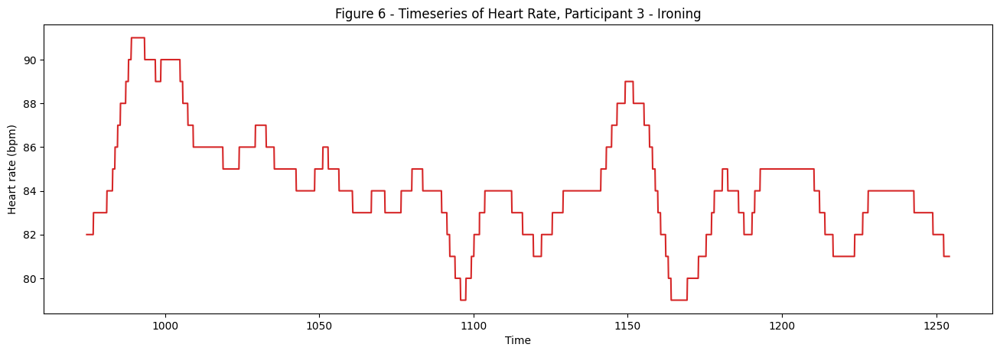

In [30]:
plot_df(p3_la, x=p3_la['timestamp'], 
        y=p3_la['heart_rate'], title='Figure 6 - Timeseries of Heart Rate, Participant 3 - Ironing')

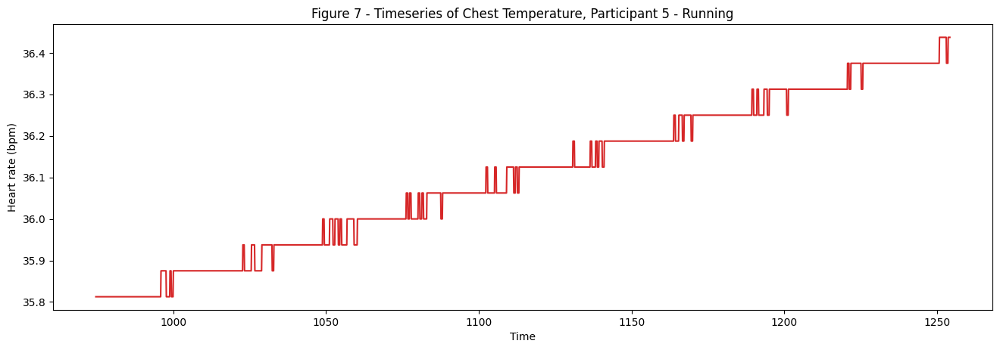

In [31]:
plot_df(p5_va, x=p3_la['timestamp'], 
        y=p3_la['chest_temp'], title='Figure 7 - Timeseries of Chest Temperature, Participant 5 - Running')

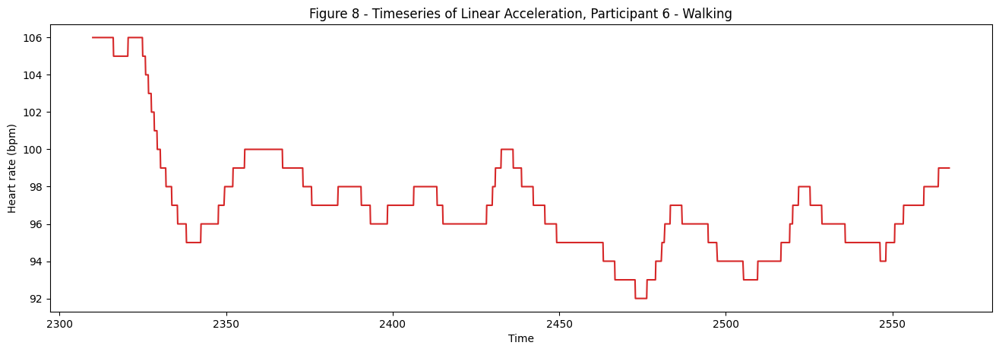

In [32]:
plot_df(p6_ma, x=p6_ma['timestamp'], 
        y=p6_ma['heart_rate'], title='Figure 8 - Timeseries of Linear Acceleration, Participant 6 - Walking')

### Individual activity data - plot discussion
The plots above explore the variables of interest from selected individuals. We get a graphical representation of heart rate and temperature at various sites, over time.
<br>

In Figure 1 above, we see heart rate during a low intensity activity start out fairly low, around 82 bpm and attain a peak value of about 91 bpm soon after. There is another peak around the 1150 timestamp but the data is spread over a fairly limited range with a mean heart rate of 84.25 (SD 2.48).
<br>
In Figure 2, chest temperature during a run by Participant 5 is shown to be on a slow, steady increase from the beginning of the activity to the end of it. It starts off around 36.4 degrees and attains a maximum of 36.62.

In [33]:
import plotly.express as px
df = training_clean
fig = px.scatter(df, x="timestamp", y="heart_rate", color='activityId')
fig.update_layout(
    title={
        'text': "Figure 9: Histogram of heart rate across time, grouped by Activity Id in Training Data",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        xaxis_title="Time",
        yaxis_title="Heart Rate (bpm)",
        )
fig.show()

### 3.4.2 Scatterplots

The scatter plot in Figure 7 presents the sequence in which the activities took place, over time. It shows regular groupings of similar data. This suggests that the participants undertoook the activities around the same time, and in the same order. There are two gaps which possibly represents a rest break in the flow of activities.

## 3.5 Relationship between variables


### 3.4.1 Correlation

Text(0.5, 1.0, 'Figure 10: Correlation heatmap for variables in dataset')

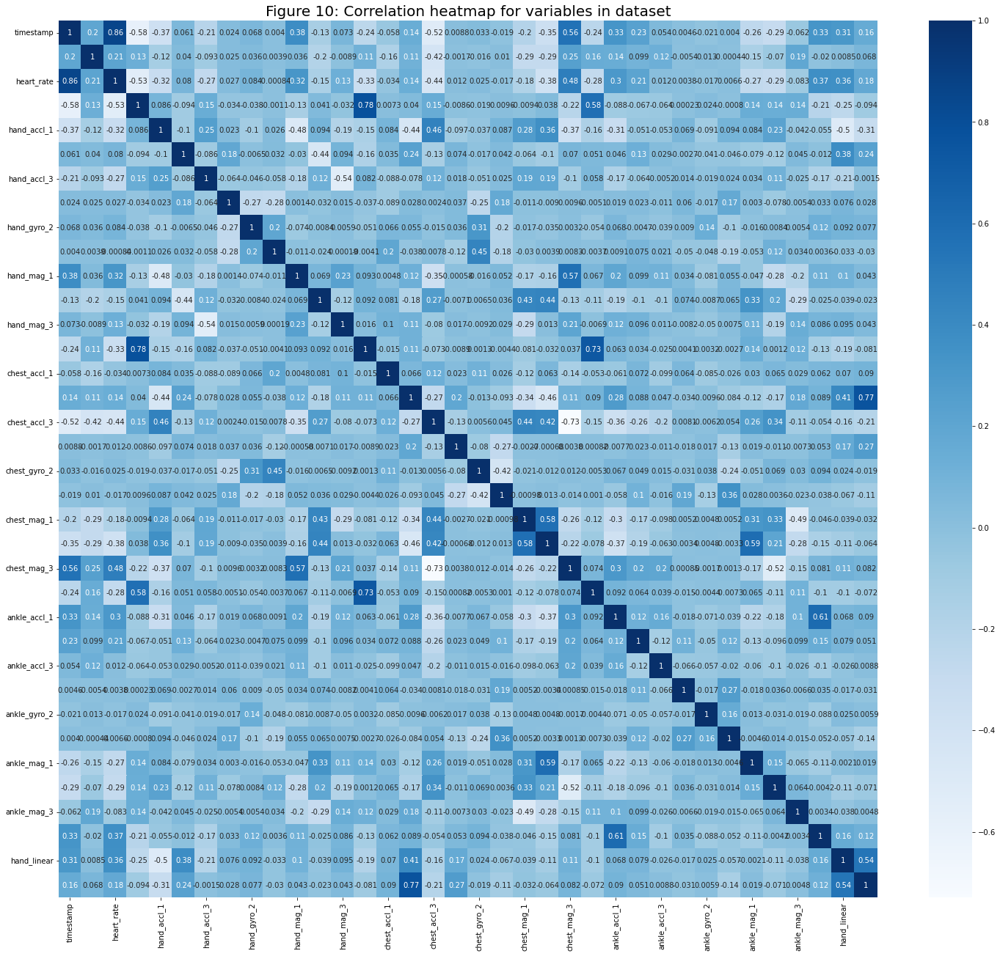

In [34]:
import seaborn as sb
corr = training_clean.corr()
dfhm = sb.heatmap(corr, cmap="Blues", annot=True)
# ax = plot.axes()
# plot.figure(figsize = (100,100))
plot.gcf().set_size_inches(25, 22)
# ax.set_title('Figure 6: Correlation heatmap for variables in dataset')
plot.title('Figure 10: Correlation heatmap for variables in dataset', fontsize =20)

The correlation matrix in Figure 6 shows which variables are correlated, the nature of the correlation and to what degree the correlation exists.

<br>

Some correlations are unsurprising, such as the one which exist between the temperature readings from the different IMU sites:


*   Chest temp and Hand temp (0.78)
*   Ankle temp and chest temp (0.71)

Some other correlations show an interesting link, such as the one between:


*   Heart rate and ankle linear acceleration (0.32)
*   Heart rate and hand temp (-0.44)

There is a moderate positive correlation between heart rate and ankle linear acceleration and a moderate negative correlation between heart rate and hand temperature

Some other results were a little more surprising. For example, the hand linear acceleration showed a slightly stronger positive correlation to heart rate than the ankle linear acceleration, to heart rate (0.36 as opposed to 0.32). The chest magnetometer appears to be correlated with the heart rate.

<br>





# 4. Hypothesis investigation and Inferential Statistics

## 4.1 Hypotheses

Given the results from the Data exploration in the previous section and the relationship between certain variables, the following hypotheses have been put fowrard.
The hypotheses will be written first as a statement, then again as the null and alternate versions of the hypothesis.H0 is the null hypothesis and H1 is the alternative hypothesis.

<br><br>

**Hypothesis 1**

<br>

Is the observed mean heart rate of activities in the Light Intensity activity significantly higher than 80 bpm?.

H0 = the observed mean heart rate of activities in the Light Intensity category is significantly higher than 80 bpm.
H1 = the observed mean heart rate of activities in the Light Intensity category is significantly higher than 80 bpm.

<br>

**Hypothesis 2**

<br>

If the mean ankle linear acceleration is dependent on the intensity of the activity being performed, then the mean linear acceleration for vigorous activites will be higher the the mean linear acceleration for light intensity activities.

H0 = the mean ankle linear acceleration for vigorous intensity activitties is not higher than the mean linear accceleration for light intensity activities. 

H1 = the mean ankle linear acceleration for vigorous intensity activitties is  higher than the mean linear accceleration for light intensity activities. 

## 4.2 Analyses






### 4.2.1 Comparison of sample mean
Here, we compare sample means of heart rate data in the different activity intensity categories. 

The number of records in this dataset is far in excess of 30, therefore we assume the sampling distribution is approximately normal, as supported by the Central Limit Theorem. despite the fact that the distribution of the data in the dataset as a whole is not necessarily normal, as shown in the histograms in the previous section.

<br> <br>

In [35]:
activity = training_clean.loc[:,['activity_intensity','heart_rate']]
activity_means = activity.groupby('activity_intensity')['heart_rate'].mean()
activity_std = activity.groupby('activity_intensity')['heart_rate'].std()
activity_count = activity.groupby('activity_intensity')['heart_rate'].count()

AV = (activity_means['Light Intensity']-80)/(activity_std['Light Intensity']/np.sqrt(activity_count['Light Intensity']))
p_value_from_normal=(1-stats.norm.cdf(AV))
print('Mean light activity heart rate from data: ',activity_means['Light Intensity'])
print ('one tail p value from normal: ', p_value_from_normal)   

Mean light activity heart rate from data:  84.28045315654987
one tail p value from normal:  0.0


**Significance testing - Testing sample means**

<br>

From the significance testing of the average heart rate in the Light Intensity Category, a p-value of 0 was obtained. This result suggests that there is almost no chance that our data occured by chance, it satisfies even a 99% confidence requirement (p < 0.1) . This means that the null hypothesis should be rejected and the alternative hypothesis can be accepted.

# 5. Unsupervised learning and dimensionality reduction




In [37]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import adjusted_rand_score

## 5.1 Clustering
In this section, an attempt at unsupervised learning will be made to determine natural clustering of data points from the dataset.


### 5.1.1 Pre-processing for clustering

At this step, the relevant variables identified in the data exploration section are sectioned out into new dataframes, to serve as inputs into the clustering model. This helps to avoid colinearity issues which might stem from including y-axis accelerometer data, which has been shown to be highly correlated to the computed linear acceleration variable. This has also informed the decision to keep measurements of a specific variable from only one IMU site - for example, chest temperature and hand temperature are also strongly correlated.

Identifying variables like ParticipantId and activityId are also stripped away to avoid skewing the data. There is also a concern to keep data dimensionality manageable.
<br>

Also, the data will be made scaled, using  standardization. Standardization scales, or shifts, the values for each numerical feature in the dataset so that the features have a mean of 0 and standard deviation of 1.

In [38]:
# Create new dataframes based on variables of interest selected using EDA insights

clustertrain = training_clean.loc[:, ['heart_rate', 'hand_temp', 'ankle_linear']]
clusterlabel = training_clean.loc[:, [ 'activity_intensity']]
clustertest = training_clean.loc[:, ['heart_rate', 'hand_temp', 'ankle_linear']]

# alternate dataset, discussed under section 5.1.2
clustertrain2 =  training_clean.loc[:,[ 'heart_rate', 'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3',
                                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                                    'ankle_linear', 'hand_linear', 'chest_linear']]


# cluster labels - alternate dataset
clusterlabel2 = training_clean.loc[:, [ 'activity_intensity']]

In [39]:
#define function for reclassifying data numerically based on intensity classification
def reclass(row):
    if row['activity_intensity'] == 'Light Intensity':
        val = 1
    elif row['activity_intensity'] == 'Moderate Intensity':
        val = 2
    else:
        val = 3
    return val

# #create new column num intensity using the function above and drop old labelled column
clusterlabel['num_intensity'] = clusterlabel.apply(reclass, axis=1)
clusterlabel = clusterlabel.drop('activity_intensity', 1)



# standardization of training data
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(clustertrain)


# create new column num intensity using the function above and drop old labelled column - alternate dataset
clusterlabel2['num_intensity'] = clusterlabel2.apply(reclass, axis=1)
clusterlabel2 = clusterlabel2.drop('activity_intensity', 1)



# standardization of training data - alternate dataset
# Commented out bcause scaler and scaler train vaiables map through


scaler = StandardScaler()
scaled_feat = scaler.fit_transform(clustertrain2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



In [40]:
#requiredimports
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.cluster import AgglomerativeClustering as Agg 
from collections import defaultdict


In [41]:
# Run K means Clustering algo with k= 3, random init
kmeans = KMeans(
    algorithm = 'auto',
    n_clusters = 2,
    max_iter = 600
)

kmeans.fit(scaled_feat)

KMeans(max_iter=600, n_clusters=2)

In [42]:
X = np.array(clustertrain).astype(float)
y = np.array(clusterlabel)

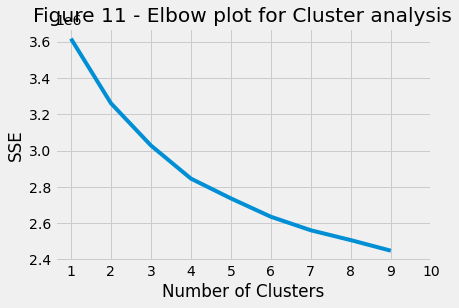

<Figure size 360x360 with 0 Axes>

In [55]:
# Trying different values of K for the clustering algorithm; from 1 to 10
# use elbow method to find optimum k-value

kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
}
# A list to hold the SSE values for each k
sse = []
for k in range(1, 10):
  kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
  kmeans.fit(scaled_feat)
  sse.append(kmeans.inertia_)
# Elbow plot
plot.style.use("fivethirtyeight")
plot.plot(range(1, 10), sse)
plot.xticks(range(1, 11))
plot.xlabel("Number of Clusters")
plot.ylabel("SSE")
plot.title("Figure 11 - Elbow plot for Cluster analysis")
plot.figure(figsize=(5, 5))
plot.show()

### 5.1.2 K-means clustering 

Having prepared the data to be serve as the algorithm input, the algorithm was run with a range of different vavlues for the number of centroids to be used in the clustering.

<br>

An elbow plot was used to determine what the best value of K was likely to be. The plot shows that k = 2 or 3 was the optimum value. 
<br>The prediction capacity of the model was tested and when K = 3, the algotithm had an accuracy of 0.3. When K was reduced to 2, the accuracy improved to 0.52. A further increase in the K-value to 4, resulted in a drop to 0.35.

<br>

Using an alternate dataset which retains all the variables, except 'timestamp', participantid and activityid doesn't yield better results. At k = 3, the accuracy of the predictions was worse, with a score of 0.26. At k = 4, the score deteriorated to 0.11.


<br>

Also, the data will be scaled, using  standardization. Standardization scales, or shifts, the values for each numerical feature in the dataset so that the features have a mean of 0 and standard deviation of 1.

In [ ]:
# Cluster analysis
K = 3
links=['ward', 'complete', 'average']
labels=[]
for linkage in links:
  clf=Agg(linkage=linkage,n_clusters=K)
  labels.append(clf.fit_predict(X))

scores=defaultdict(list)
for i,ll in enumerate(linkages):
  for j,ll in enumerate(linkages):
    s=adjusted_rand_score(labels[i],labels[j])
    scores[11].append(s)

df=pd.DataFrame(scores,columns=links, index=links)
df

In [ ]:
def divide(data, labels):
  xclusters = defaultdict(list)
  yclusters = defaultdict(list)
  for datapoint,label in zip(data,labels):
    x = datapoint[0]
    y = datapoint[1]
    xclusters[label].append(x)
    yclusters[label].append(y)
  return xclusters, yclusters


In [ ]:
# plot data points
clusters = divide(scaled_feat,kmeans.predict(scaled_feat))

plot.scatter(clusters[0][0], clusters[1][0])
plot.scatter(clusters[0][1], clusters[1][1])
plot.scatter(clusters[0][2], clusters[1][2])

## 5.3 Principal Component Analysis

Give the low accuracy scores obtained in the clustering exercise, the dataset was run through PCA to effect dimensionality reduction and investigate if the data's principal components could be isolated.

<br>

Principal component analysis aims to reduce the complexity oh high-dimensional data by distilling it to its core principal components which are responsible for most of the variance in the data.

<br>

This will be undetaken using sklean's PCA function.



In [78]:
# required imports
from sklearn.decomposition import PCA


In [79]:
pcainput = training_clean.loc[:,[ 'heart_rate', 'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3',
                                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                                    'ankle_linear', 'hand_linear', 'chest_linear']]

In [81]:
pcainput= training
features = ['heart_rate', 'hand_temp', 'hand_accl_1','hand_accl_2','hand_accl_3', 'hand_gyro_1','hand_gyro_2','hand_gyro_3', 'hand_mag_1','hand_mag_2','hand_mag_3',
                                    'chest_temp', 'chest_accl_1', 'chest_accl_2', 'chest_accl_3', 'chest_gyro_1', 'chest_gyro_2', 'chest_gyro_3', 'chest_mag_1', 'chest_mag_2', 'chest_mag_3',
                                    'ankle_temp', 'ankle_accl_1', 'ankle_accl_2', 'ankle_accl_3', 'ankle_gyro_1', 'ankle_gyro_2', 'ankle_gyro_3', 'ankle_mag_1', 'ankle_mag_2', 'ankle_mag_3', 
                                    'ankle_linear', 'hand_linear', 'chest_linear']

pca = PCA()
components = pca.fit_transform(pcainput[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    title="Figure 12: Principal Components in Training Data"
)
fig.update_traces(diagonal_visible=False)
fig.show()

Figure 12 above shows the principal components of the data. Principal components 1 and 2 together account for 46.9% of the variance in the dataset. When principal components 3 and 4 are added in, 67.2% of the total variance can be explained.

# 5. Supervised learning - Modelling

*   Linear regression model
*   Regularised regression model

use each model obtain equations.
<br>

create a model that can predict:

a) activityId based on heart rate (chest temp, hand temp.)
b) activityId based on ankle linear accel

### Model validation
Implement models and evaluate performance metrics: recall, precision and accuracy and F-Score on test data.









In [60]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression

## 5.1 Linear Regression model

In [56]:
# Model 1: Linear regression

Model_lineartrain = training_clean.loc[:,[ 'heart_rate', 'hand_temp','ankle_linear', 'hand_linear']]
Model_lineartest = test_clean.loc[:,[ 'heart_rate', 'hand_temp','ankle_linear', 'hand_linear']]

In [61]:
regressor = LinearRegression()
regressor.fit(Model_lineartrain[['ankle_linear']], Model_lineartrain[['heart_rate']])

LinearRegression()

In [62]:
print("The regressor intercept is: " + str(regressor.intercept_))
print("The regressor coefficient is: " + str(regressor.coef_))

The regressor intercept is: [87.9848116]
The regressor coefficient is: [[1.3275651]]


In [63]:
y_pred = regressor.predict(Model_lineartest[['ankle_linear']])

## 5.2 Logistic Regression model

In [ ]:
# Model 2 : Logistic regression

# regularisedRegression() takes 4 arguments: x and y arrays, the order of the polynomial and the regularization paramenter.  
# It returns two things: the regularised parameters (for the polynomial) in variable w and the augmented matrix in variable X containing the powers of X.


def regularisedRegression(x,y,order,lam): # Calculate regularised regression parameters
# order: order of the polynomial
# lam: value of the regularisation parameter lambda (NB: lambda is a reserved word in Python so don't use as variable name!)
    N = np.size(x) # how many samples
    X = augmentedx(x,order)
    if lam>0: # if there is regularisation
        w = np.dot(np.linalg.inv(np.dot(np.transpose(X),X)+N*lam*np.eye(order+1)),np.dot(np.transpose(X),y)) # formula in the lecture notes
    else: # the non-regularised formulation
        w = np.dot(np.linalg.inv(np.dot(np.transpose(X),X)),np.dot(np.transpose(X),y)) # formula in the lecture notes
    return w,X

In [67]:
# input vector c
X = np.array(clustertrain).astype(float)

In [69]:
# res=regularisedRegression(df['x_obs'],df['y_obs'],3,0.1)

In [76]:
# def augmentedx(x,order):
#     '''
#     create augmented matrix (for polynomial of order given in argument)
#     '''
    
#     N = np.size(x)
#     X=np.zeros((N,order+1))
#     for k in range(order+1):
#         X[:,k]=np.power(x,k)
#     return X


In [77]:
# aug_matrix = augmentedx(x,5) 

The choice of a fifth order polynomial was made in the attempt to limit the amount of learning bias, while still maintaining a reasonable amount of variance in the model and avoid underfitting by using a model that is too simple.

In [74]:
# xarray = np.array(training_clean[training_clean['heart_rate']])
# yarray = np.array(training_clean[training_clean['activity_intensity']])
# order = 5
# lam = 0.003

# # lam - 0.01 much less complex, lam @ 0 non regularized regression, lam @ 0.000001 good balance, loss minimised.


# regularisedRegression(xarray, yarray, order, lam)

In [75]:
# predict(): this function takes two arguments: x an array of x-values for which to predict the y-values, and w an array of parameters. 
# It returns the predicted y values. You can use this function to predict unseen data.

# def predict(x,w): # Calculate predictions for a given set of observations x and parameters w (either regularised or not!)
#     order = np.size(w) # extract order of polynomial from size of parameters
#     X = augmentedx(x,order-1)
#     y_pred = np.dot(X,w)
#     return y_pred

# 7. Conclusion

This study found significant correlations between key variables of interest such as heart rate, temperature and linear acceleration at specific body sites. Clear dependencies between the variables were more difficult to identify and characterize.

<br>

Classifying the activities into categories using a priori data about the energy consumption levels associated with each activity was straightforward, however drawing out the same groupings from the data using the k-means clusting method proved difficult. Using a more streamlined dataset improved the results to some extent, but only two broad categories were identified.

<br>

Modelling funtional dependence between the variables of interest was also complicated with the logistic regression model. THe linear regression, perhaps overly simplistic, served as a second model.

Also, methods like random subsampling, and K-fold cross-validation were not used for the selection of lambda due to a concern about further limiting the amount of training data available.

<br>

The Principal component analysis also confirmed the density and wide spread of the dataset. Four Pcincipal components were required to capture about 70% of the variance.

## 7.1 Limitations of the study

There was a time contraint on this study and as such, not every analytical technique possible was feasible to perform in the given timeframe. Also, the decision to implement a test/train split on the basis of participant groupings, as oppossed to conducting a split based on randomization on a merged dataset may have influenced the results.


<br>

The parameters in the logistic regression model were not explored exhaustively and it is  possible a better parameterization is possible for improved results.


<br>

More broadly, this study did not explore every model possible in order to establish predictability of activity intensity based on the features present in the dataset. However, with sustained effort, the possibilty of finding such a model is not precluded.

# References

Taylor, N., Kondo, N., & Kenney, W. L. (2008). The physiology of acute heat exposure, with implications for human performance in the heat.

Physical Activity Guidelines Advisory Committee. (2008). Physical activity guidelines advisory committee report, 2008. Washington, DC: US Department of Health and Human Services, 2008, A1-H14.

